# scRNA data preparation for the celloracle analysis
In this notebook we are going to preprocess the scRNA-seq to be used in celloracle analysis. 

In [1]:
## import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import louvain

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["figure.figsize"] = [6, 4.5]

In [245]:
# Download dataset. You can change the code blow to use your data.
adata = sc.read_10x_mtx("/Users/okendojo/Desktop/scRNA/hui_data/reprocessedData/36hpa_filtered_feature_bc_matrix/",var_names='gene_symbols')

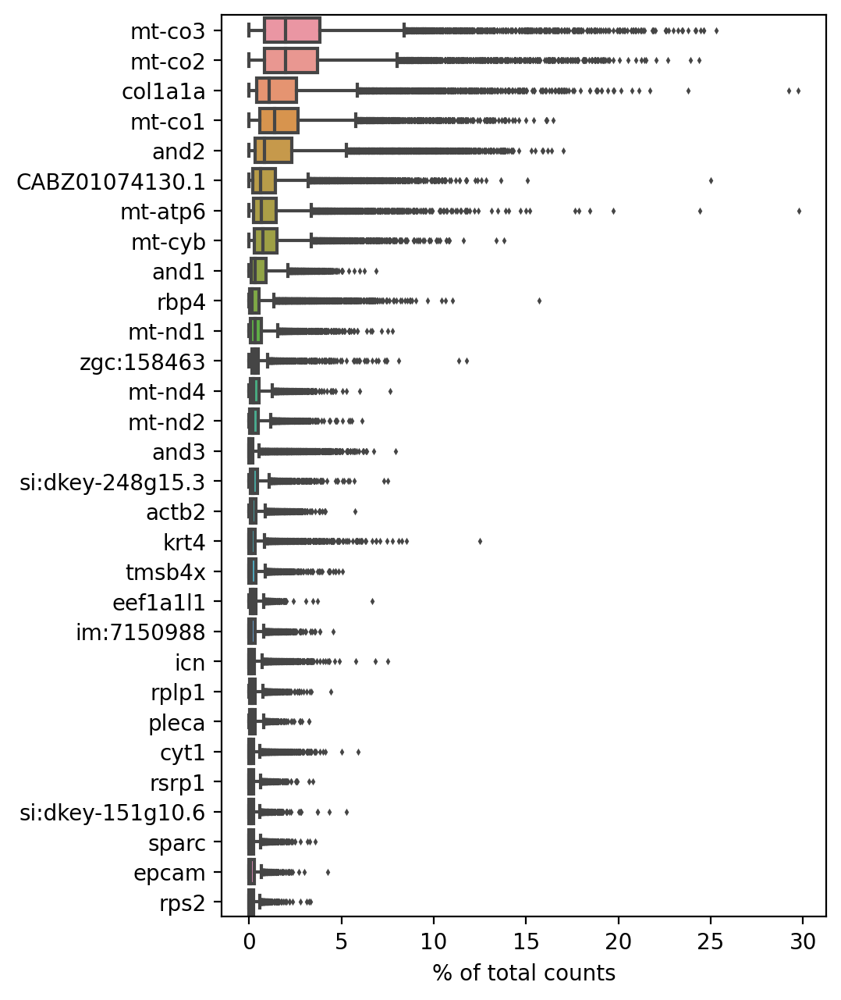

In [169]:
#check the higly expressed genes at a glance
sc.pl.highest_expr_genes(adata, n_top=30, )


## Filtering

In [170]:
# Only consider genes with more than 5 count
sc.pp.filter_genes(adata, min_counts=5)
sc.pp.filter_cells(adata, min_genes=200)

In [171]:
#Let’s assemble some information about mitochondrial genes, which are important for quality control.
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

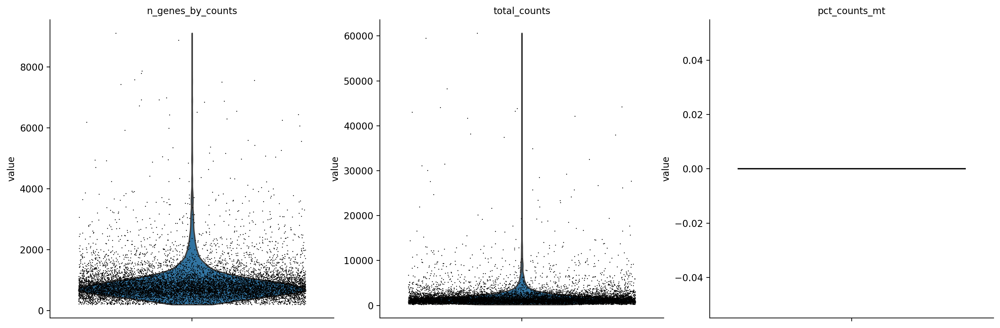

In [172]:
#A violin plot of some of the computed quality measures:
#the number of genes expressed in the count matrix
#the total counts per cell
#the percentage of counts in mitochondrial genes
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

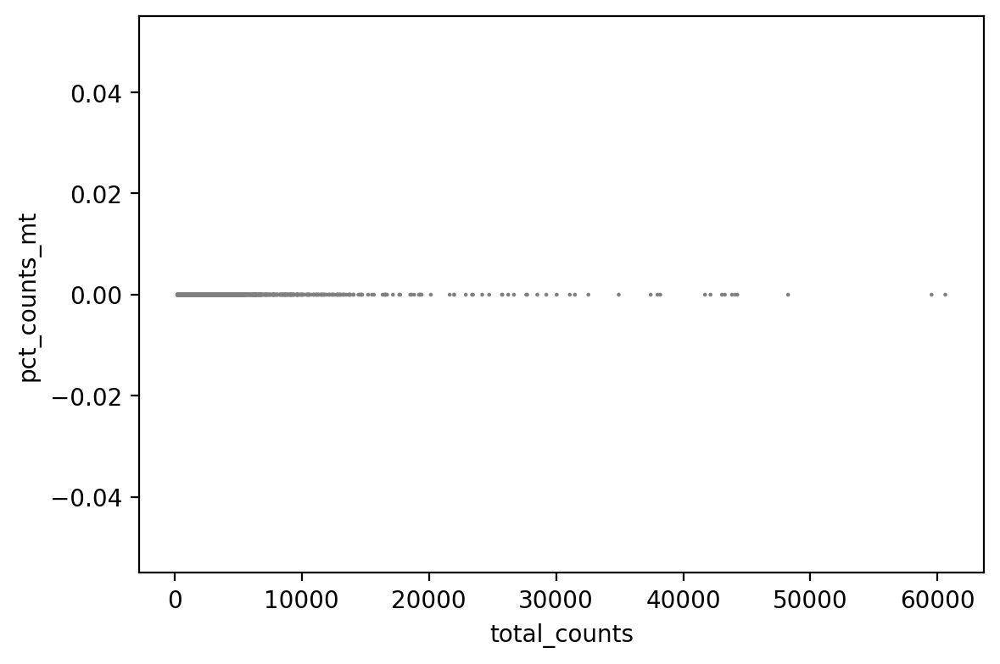

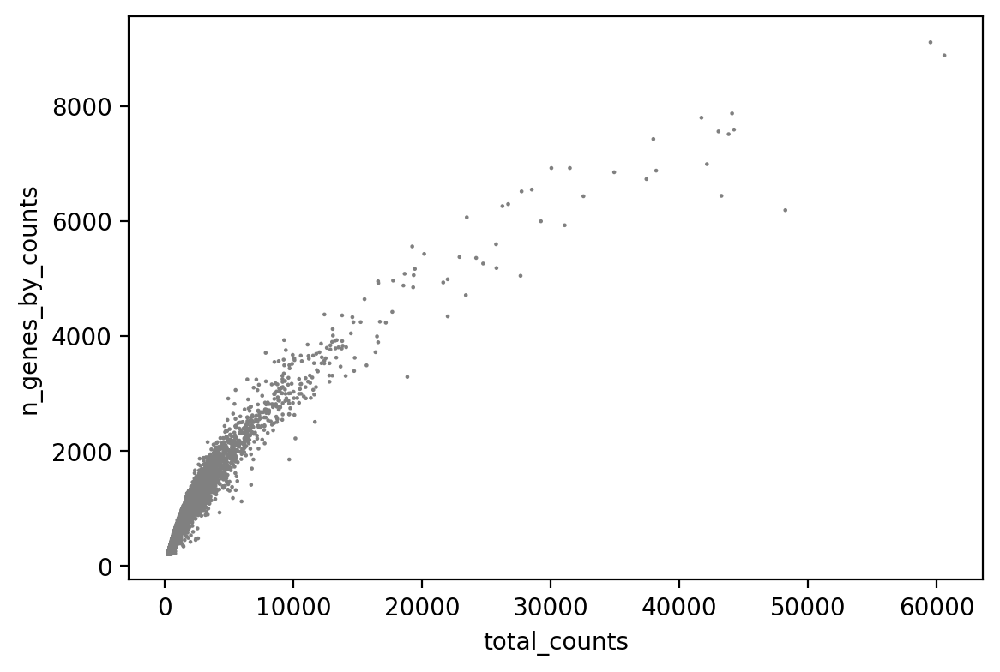

In [173]:
#Remove cells that have too many mitochondrial genes expressed or too many total counts:

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [174]:
#Actually do the filtering by slicing the AnnData object.
adata = adata[adata.obs.n_genes_by_counts < 4000, :]
adata = adata[adata.obs.pct_counts_mt < 1, :]

# Normalize

In [175]:
# Normalize gene expression matrix with total UMI count per cell
sc.pp.normalize_per_cell(adata, key_n_counts='n_counts_all')

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:524: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_n_counts] = counts_per_cell


In [176]:
adata

AnnData object with n_obs × n_vars = 10963 × 20985
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts_all'
    var: 'gene_ids', 'feature_types', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

## Identification of highly variable genes
Removing non-variable genes reduces the calculation time during the GRN reconstruction and simulation steps. It also improves the overall accuracy of the GRN inference by removing noisy genes. We recommend using the top 2000~3000 variable genes.

In [177]:
# Select top 2000 highly-variable genes
filter_result = sc.pp.filter_genes_dispersion(adata.X,
                                              flavor='cell_ranger',
                                              n_top_genes=2000,
                                              log=False)

# Subset the genes
adata = adata[:, filter_result.gene_subset]

# Renormalize after filtering
sc.pp.normalize_per_cell(adata)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:524: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_n_counts] = counts_per_cell


In [178]:
adata

AnnData object with n_obs × n_vars = 10963 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts_all', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

## Log transformation
We need to log transform and scale the data before we calculate the principal components, clusters, and differentially expressed genes.

We also need to keep the non-transformed gene expression data in a separate anndata layer before the log transformation. We will use this data for celloracle analysis later.

In [179]:
# keep raw cont data before log transformation
adata.raw = adata
adata.layers["raw_count"] = adata.raw.X.copy()


# Log transformation and scaling
sc.pp.log1p(adata)
sc.pp.scale(adata)

In [180]:
adata

AnnData object with n_obs × n_vars = 10963 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts_all', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'log1p'
    layers: 'raw_count'

## PCA and neighbor calculations
These calculations are necessary to perform the dimensionality reduction and clustering steps.




In [181]:
# PCA
sc.tl.pca(adata, svd_solver='arpack')

# Diffusion map
sc.pp.neighbors(adata, n_neighbors=4, n_pcs=20)

sc.tl.diffmap(adata)
# Calculate neihbors again based on diffusionmap
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_diffmap')

## Cell clustering

In [182]:
sc.tl.louvain(adata, resolution=0.8)

In [183]:
adata

AnnData object with n_obs × n_vars = 10963 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts_all', 'n_counts', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'diffmap_evals', 'louvain'
    obsm: 'X_pca', 'X_diffmap'
    varm: 'PCs'
    layers: 'raw_count'
    obsp: 'distances', 'connectivities'

## Dimensionality reduction using PAGA and force-directed graphs

In [184]:
# PAGA graph construction
sc.tl.paga(adata, groups='louvain')

In [185]:
plt.rcParams["figure.figsize"] = [6, 4.5]


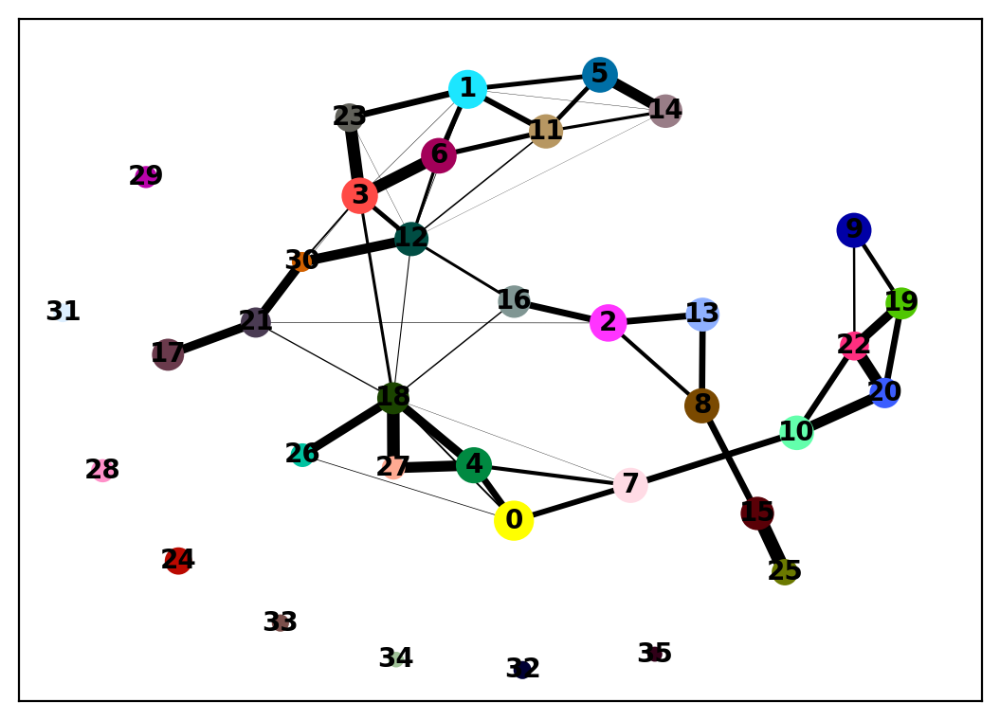

In [186]:
sc.pl.paga(adata)

In [187]:
sc.tl.draw_graph(adata, init_pos='paga', random_state=123)


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


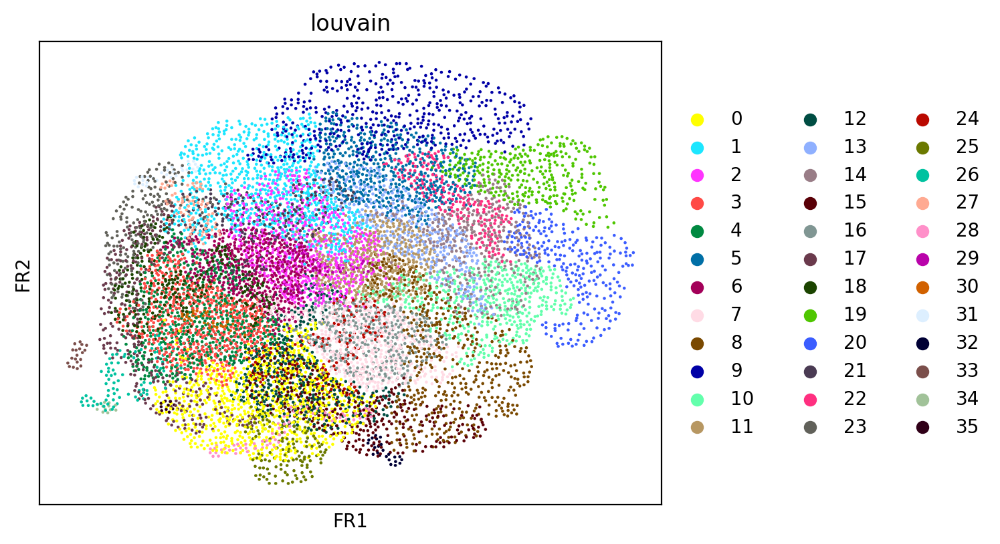

In [188]:
sc.pl.draw_graph(adata, color='louvain', legend_loc='right margin')


In [189]:
#Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

sc.tl.louvain(adata)


In [190]:
#embeding the neighborhood graphs
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata, init_pos='paga')

In [191]:
sc.tl.umap(adata)


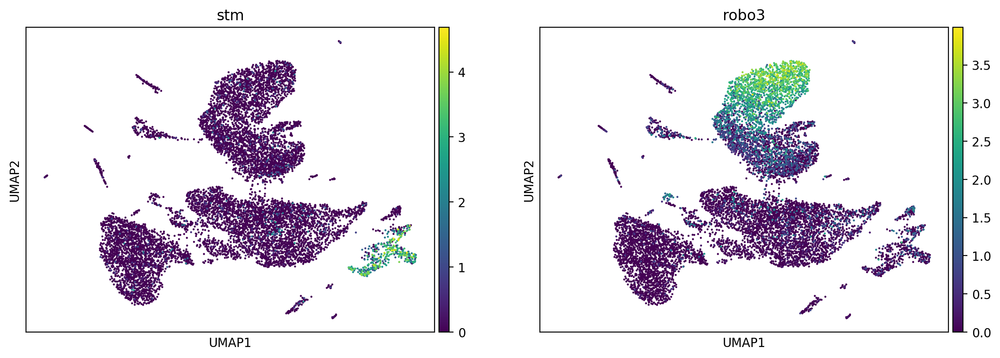

In [192]:
sc.pl.umap(adata, color=['stm', 'robo3'])


In [193]:
#Clustering the neighborhood graph
sc.tl.louvain(adata)


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


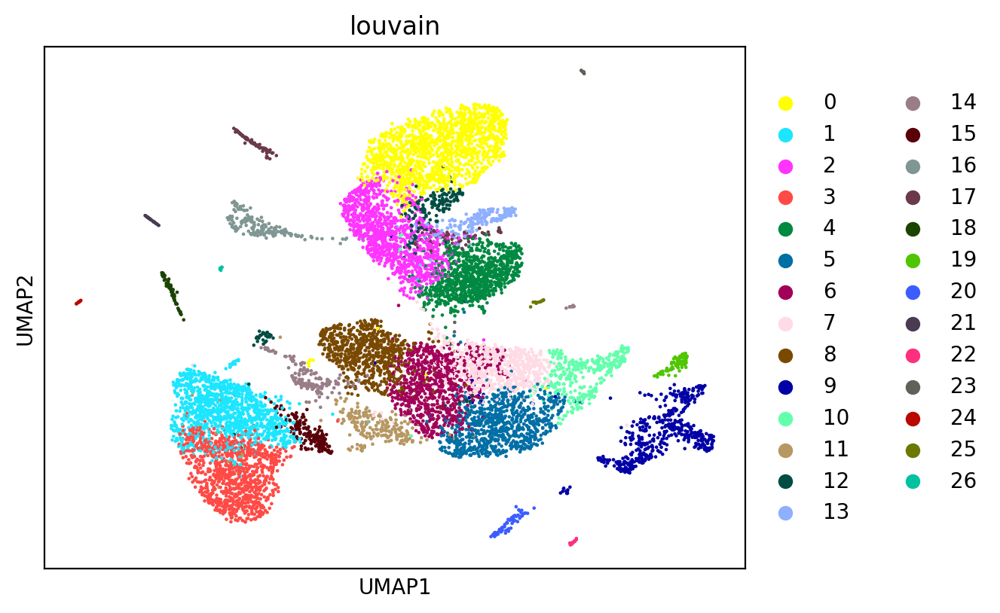

In [195]:
sc.pl.umap(adata, color=['louvain'])#, 'stm', 'robo3'])


## Finding marker genes


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanp

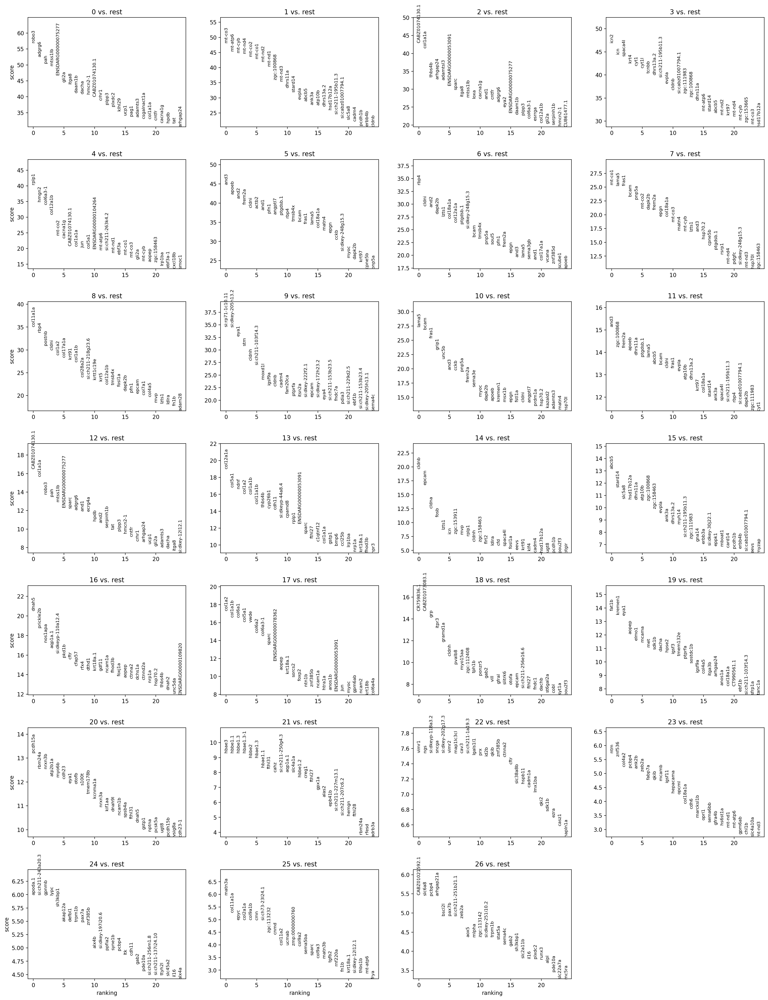

In [196]:
sc.tl.rank_genes_groups(adata, 'louvain', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [201]:
# Show top 10 ranked genes per cluster
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)


,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,robo3,mt-co3,CABZ01074130.1,icn2,rplp1,and3,rbp4,mt-co1,col11a1a,si:rp71-1c10.11,...,col1a2,CR759836.1,fat1b,pcdh15a,hbae3,vimr1,ntm,apoda.1,matn3a,CABZ01021592.1
1,adgrg6,mt-atp6,col1a1a,icn,hmgn2,apoeb,cldni,lama5,rbp4,si:dkey-205h13.2,...,col1a1b,CABZ01073083.1,kremen1,rbm24a,hbbe1.1,ngs,znf536,si:ch211-243a20.3,col11a1a,slc6a8
2,pah,mt-cyb,thbs4b,spaca4l,col6a3-1,and2,and2,fras1,postnb,eya1,...,col6a1,grp,eya1,nrxn3b,hbbe1.3,si:dkeyp-118a3.2,col4a2,gpnmb,epyc,pcbp4
3,mtss1lb,mt-nd4,arhgap24,krt4,col12a1b,frem2a,dapk2b,bcam,cldni,stm,...,col5a1,itpr3,aopep,atp2b1a,hbae1.3-1,sncga,pcbp4,lypc,col2a1a,arhgap21a
4,ENSDARG00000075277,mt-co2,adamtsl3,cyt1,mt-co2,cldni,lzts1,pnp5a,col1a2,cldnh,...,vwde,gramd1a,elmo1,myo6b,hbbe2,si:dkey-202g17.3,ank2b,sh3kbp1,col9a1b,bscl2l
5,gli2a,mt-co1,ENSDARG00000053091,cyt1l,cacna1g,actb2,col18a1a,mt-co2,col17a1a,si:ch211-103f14.3,...,col6a2,cldnh,mcama,cdh23,hbae1.3,vimr2,zeb2a,akap12a,cmn,pax7b
6,itga8,mt-nd2,sparc,tcnbb,CABZ01074130.1,and1,col12a1a,dapk2b,krt91,moxd1l,...,col6a3-1,pvalb8,met,eya1,hbae1.1,map1lc3cl,fabp7a,defbl1,si:ch73-23l24.1,si:ch211-251b21.1
7,daam1b,mt-nd1,itga8,dhrs13a.2,col1a1a,pfn1,ptgdsb.1,frem2a,col1a1b,igsf9a,...,sparc,myo15aa,sdk1b,otofb,fthl31,cav3,qkib,trpm1b,zgc:113232,zeb2a
8,dacha,zgc:100868,mtss1lb,si:ch211-195b11.3,jun,angptl7,si:dkey-248g15.3,epgn,col28a2a,cldnb,...,ENSDARG00000078362,zgc:112408,dacha,s100t,cahz,si:ch211-1a19.3,mcamb,pax7a,cnmd,aox5
9,hmcn2-1,mt-nd3,loxa,evpla,col5a1,ptgdsb.1,bcam,col18a1a,si:ch211-218g23.6,cadm4,...,aopep,tph1b,hpse2,tmem178b,si:ch211-250g4.3,lgals1l1,igsf11,znf385b,col11a2,mlpha


In [226]:
#makers to assess the data
markers = {"Blastema":["col1a1a","robo3"],
          "Osteoblasr": ["si:rp71-1c10.11","stm"],
          "Dendritic cells": ["cldnb","rbp4"],
          "CD8 effector":["apoeb","cldni"]}

marker gene of Blastema


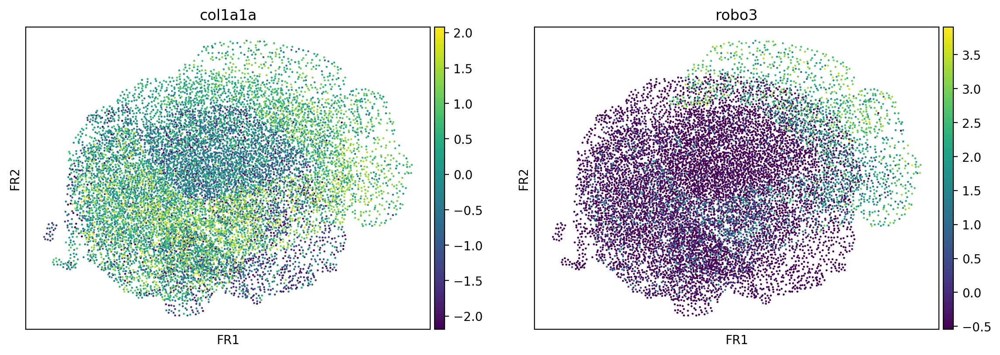

marker gene of Osteoblasr


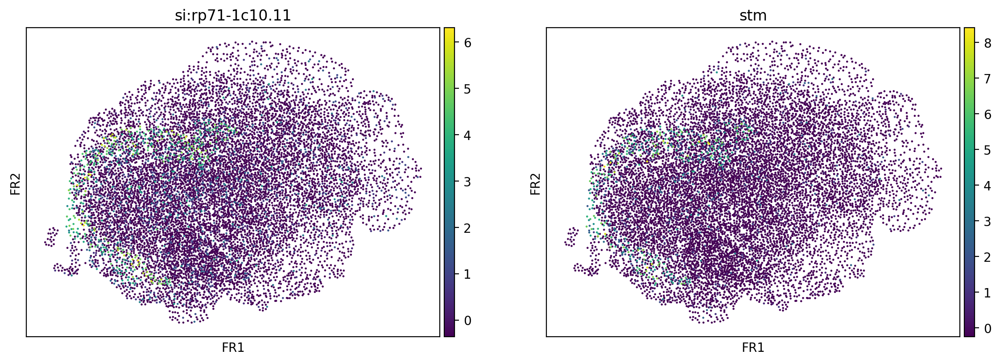

marker gene of Dendritic cells


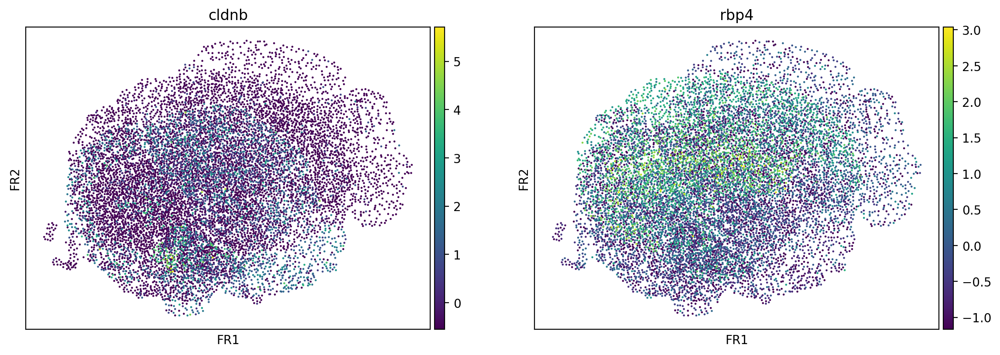

marker gene of CD8 effector


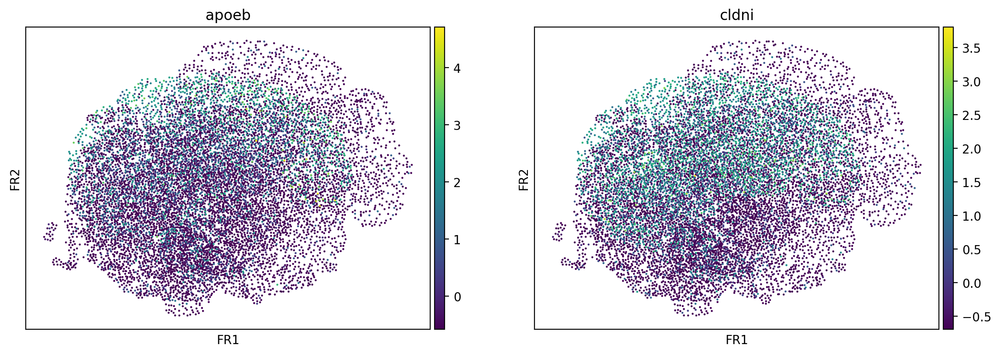

In [227]:
for cell_type, genes in markers.items():
    print(f"marker gene of {cell_type}")
    sc.pl.draw_graph(adata, color=genes, use_raw=False, ncols=2)
    plt.show()

## Cluster annotation

In [228]:
# Check current cluster name
cluster_list = adata.obs.louvain.unique()
cluster_list

['1', '6', '0', '5', '2', ..., '25', '18', '24', '23', '26']
Length: 27
Categories (27, object): ['0', '1', '2', '3', ..., '23', '24', '25', '26']

In [229]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)


,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,robo3,mt-co3,CABZ01074130.1,icn2,rplp1,and3,rbp4,mt-co1,col11a1a,si:rp71-1c10.11,...,col1a2,CR759836.1,fat1b,pcdh15a,hbae3,vimr1,ntm,apoda.1,matn3a,CABZ01021592.1
1,adgrg6,mt-atp6,col1a1a,icn,hmgn2,apoeb,cldni,lama5,rbp4,si:dkey-205h13.2,...,col1a1b,CABZ01073083.1,kremen1,rbm24a,hbbe1.1,ngs,znf536,si:ch211-243a20.3,col11a1a,slc6a8
2,pah,mt-cyb,thbs4b,spaca4l,col6a3-1,and2,and2,fras1,postnb,eya1,...,col6a1,grp,eya1,nrxn3b,hbbe1.3,si:dkeyp-118a3.2,col4a2,gpnmb,epyc,pcbp4
3,mtss1lb,mt-nd4,arhgap24,krt4,col12a1b,frem2a,dapk2b,bcam,cldni,stm,...,col5a1,itpr3,aopep,atp2b1a,hbae1.3-1,sncga,pcbp4,lypc,col2a1a,arhgap21a
4,ENSDARG00000075277,mt-co2,adamtsl3,cyt1,mt-co2,cldni,lzts1,pnp5a,col1a2,cldnh,...,vwde,gramd1a,elmo1,myo6b,hbbe2,si:dkey-202g17.3,ank2b,sh3kbp1,col9a1b,bscl2l


In [230]:
#Get a table with the scores and groups.

result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,22_n,22_p,23_n,23_p,24_n,24_p,25_n,25_p,26_n,26_p
0,robo3,0.0,mt-co3,0.0,CABZ01074130.1,0.000000e+00,icn2,0.0,rplp1,0.000000e+00,...,vimr1,4.594740e-14,ntm,9.376336e-09,apoda.1,2.016878e-09,matn3a,2.195209e-09,CABZ01021592.1,4.397968e-08
1,adgrg6,0.0,mt-atp6,0.0,col1a1a,0.000000e+00,icn,0.0,hmgn2,1.169929e-267,...,ngs,4.594740e-14,znf536,1.994972e-08,si:ch211-243a20.3,2.030518e-09,col11a1a,1.288041e-07,slc6a8,4.804897e-08
2,pah,0.0,mt-cyb,0.0,thbs4b,2.558862e-243,spaca4l,0.0,col6a3-1,6.238300e-253,...,si:dkeyp-118a3.2,4.594740e-14,col4a2,1.580087e-07,gpnmb,2.063852e-09,epyc,6.006389e-07,pcbp4,4.964273e-08
3,mtss1lb,0.0,mt-nd4,0.0,arhgap24,4.334780e-236,krt4,0.0,col12a1b,6.249868e-209,...,sncga,4.602418e-14,pcbp4,1.893276e-07,lypc,2.107157e-09,col2a1a,6.054826e-07,arhgap21a,5.035954e-08
4,ENSDARG00000075277,0.0,mt-co2,0.0,adamtsl3,1.834960e-232,cyt1,0.0,mt-co2,1.564977e-129,...,si:dkey-202g17.3,4.607544e-14,ank2b,2.239622e-07,sh3kbp1,7.575482e-09,col9a1b,6.063413e-07,bscl2l,8.357457e-07


In [231]:
# Make cluster anottation dictionary
annotation = {"MEP":[1],
              "Erythroids": [2, 3, 4, 5, 6, 7],
              "CD4 memoty": [8],
              "Megakaryocytes":[9],
              "Blastema":[10],
              "Support cells" :[11],
              "Granulocytes":[12, 13, 14],
              "Support cell 2":[15,16,17,18,19,20,21],
              "DC":[0],
              "Lymphoid":[22,23,24,25,26,27]}

# Change dictionary format
annotation_rev = {}
for i in cluster_list:
    for k in annotation:
        if int(i) in annotation[k]:
            annotation_rev[i] = k

# Check dictionary
annotation_rev

{'1': 'MEP',
 '6': 'Erythroids',
 '0': 'DC',
 '5': 'Erythroids',
 '2': 'Erythroids',
 '9': 'Megakaryocytes',
 '8': 'CD4 memoty',
 '7': 'Erythroids',
 '17': 'Support cell 2',
 '4': 'Erythroids',
 '10': 'Blastema',
 '3': 'Erythroids',
 '11': 'Support cells',
 '15': 'Support cell 2',
 '22': 'Lymphoid',
 '16': 'Support cell 2',
 '12': 'Granulocytes',
 '13': 'Granulocytes',
 '20': 'Support cell 2',
 '14': 'Granulocytes',
 '19': 'Support cell 2',
 '21': 'Support cell 2',
 '25': 'Lymphoid',
 '18': 'Support cell 2',
 '24': 'Lymphoid',
 '23': 'Lymphoid',
 '26': 'Lymphoid'}

In [232]:
#add celltype layer in the anndata object
adata.obs["cell_type"] = [annotation_rev[i] for i in adata.obs.louvain]


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


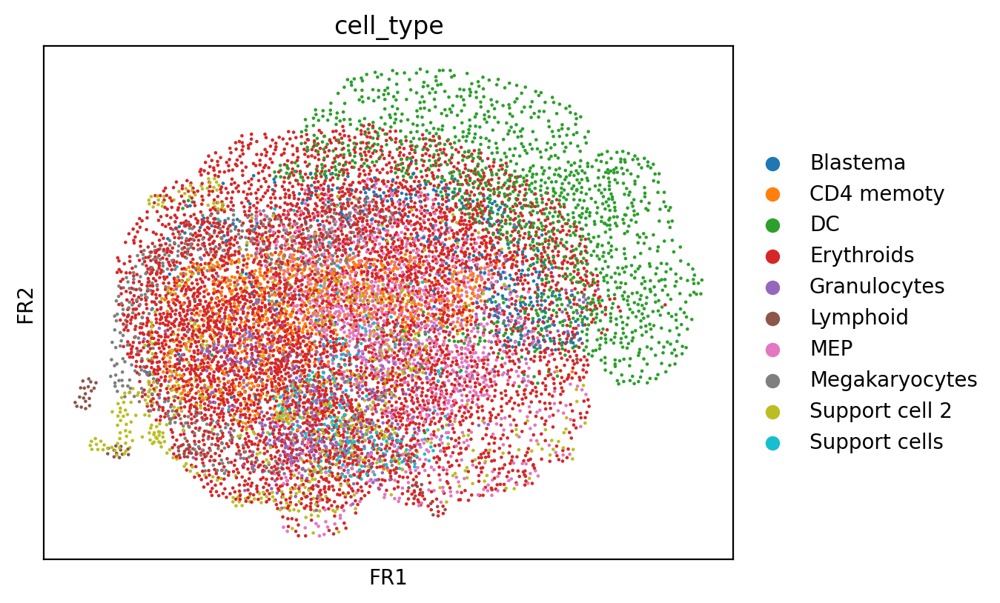

In [233]:
# check results
sc.pl.draw_graph(adata, color=['cell_type'], legend_loc='right margin')


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


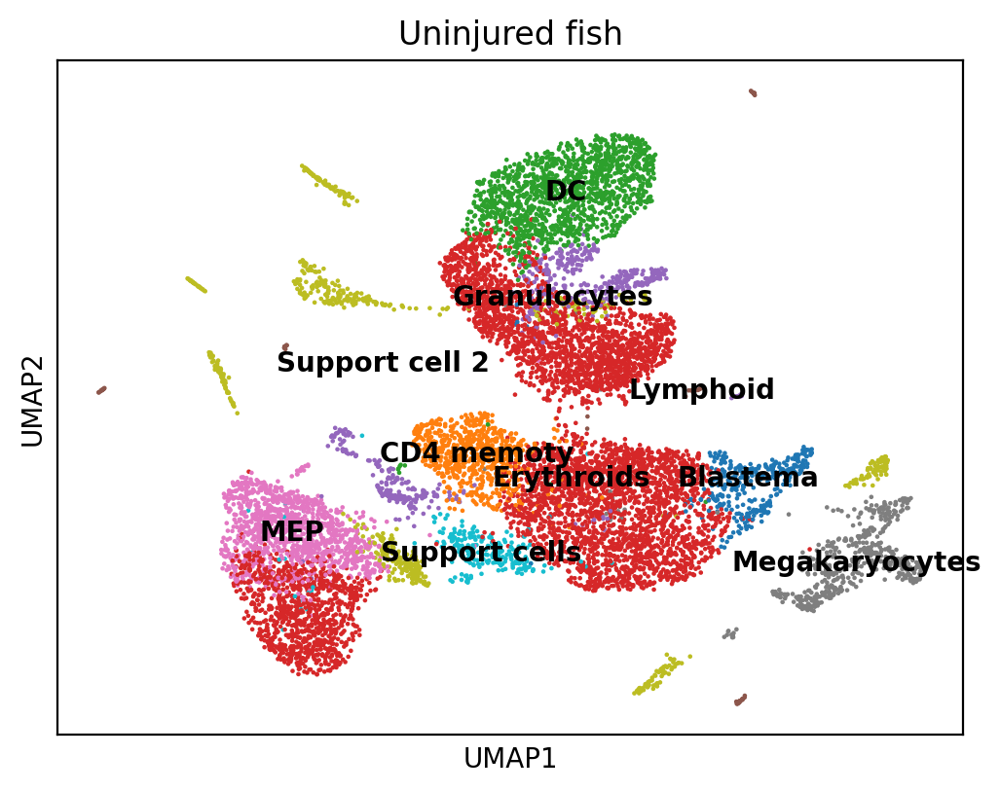

In [234]:
# check results
sc.pl.umap(adata, color=['cell_type'], legend_loc='on data', title='Uninjured fish', frameon=True, save='.pdf')


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


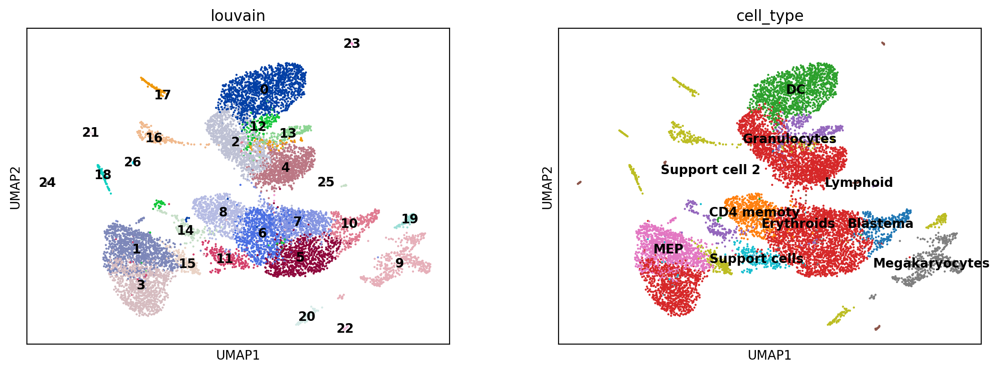

In [235]:
sc.pl.umap(adata, color=['louvain', 'cell_type'],legend_loc='on data')

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


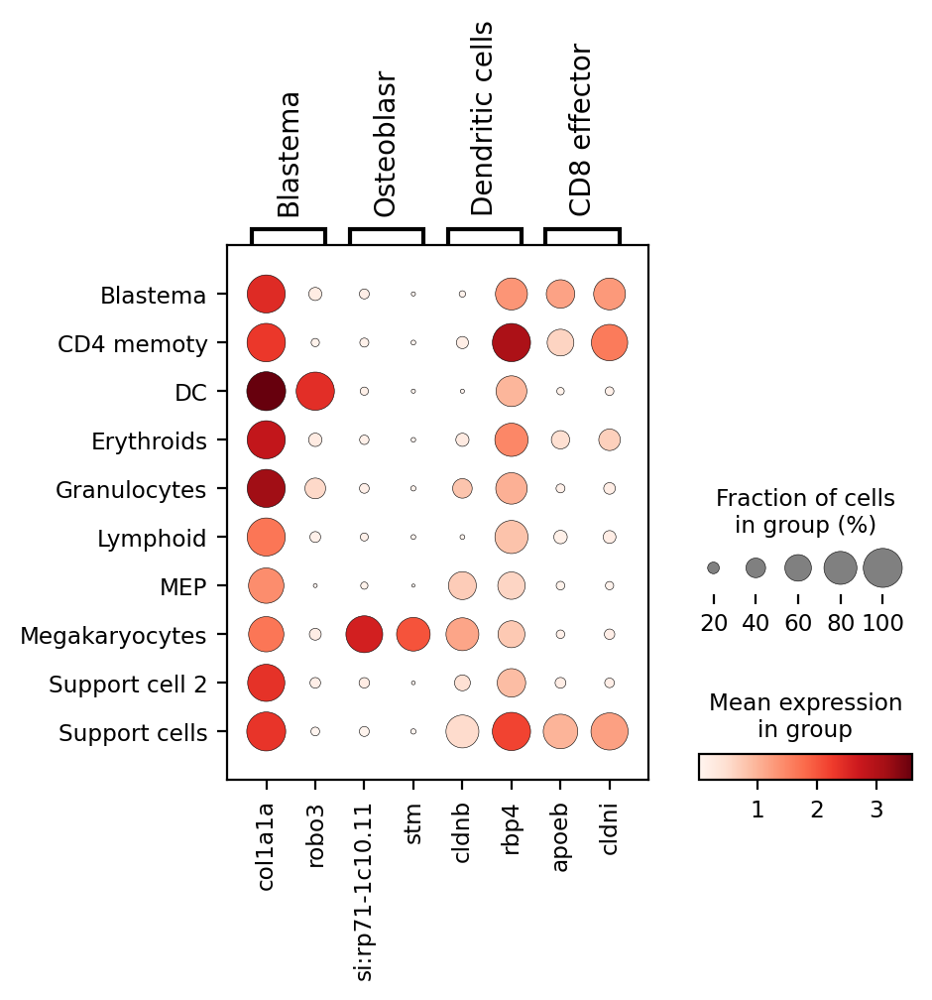

In [241]:
sc.pl.dotplot(adata, markers, groupby='cell_type');


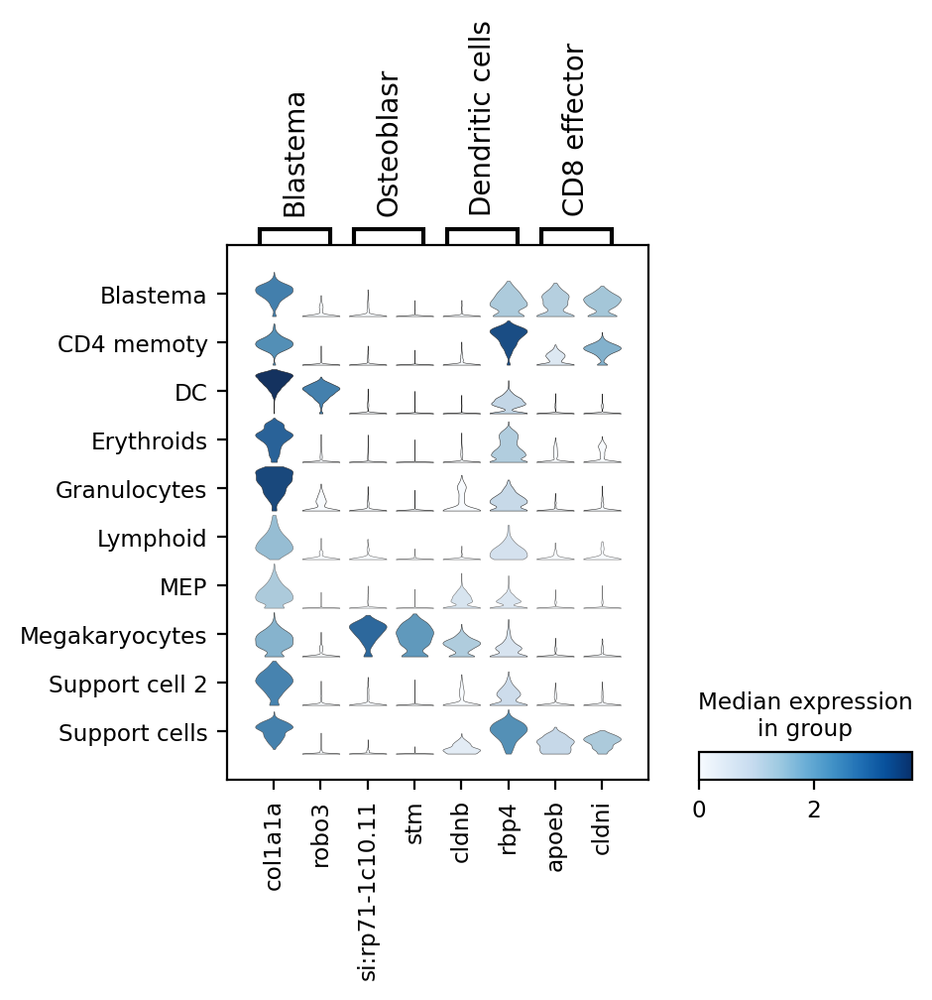

In [244]:
# compact violin plot
sc.pl.stacked_violin(adata, markers, groupby='cell_type', rotation=90);


In [242]:
#save the processed data
#adata.write_h5ad("24hpa_celloracleProcessed.h5ad")
